# Extracting Text from Norway Traffic-Sign Image

## *Import Libraries*

In [1]:
# installing keras-ocr
!pip install keras-ocr -q

In [2]:
import easyocr
import keras_ocr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from glob import glob
from PIL import Image
from tqdm.notebook import tqdm

plt.style.use('ggplot')

## *Dataset Observasion*

In [3]:
test_imgs = glob('test-sign-images/*')

### Plot Example Images on Test Imgs

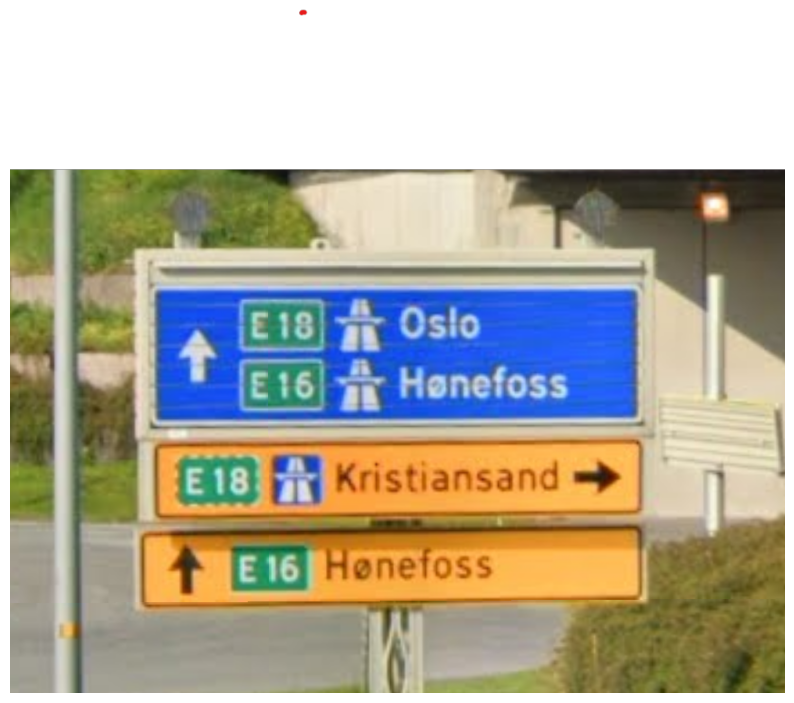

In [4]:
fig, ax = plt.subplots(figsize = (10, 10))
ax.imshow(plt.imread(test_imgs[9]))
ax.axis('off')
plt.show()

### Display All Test Images

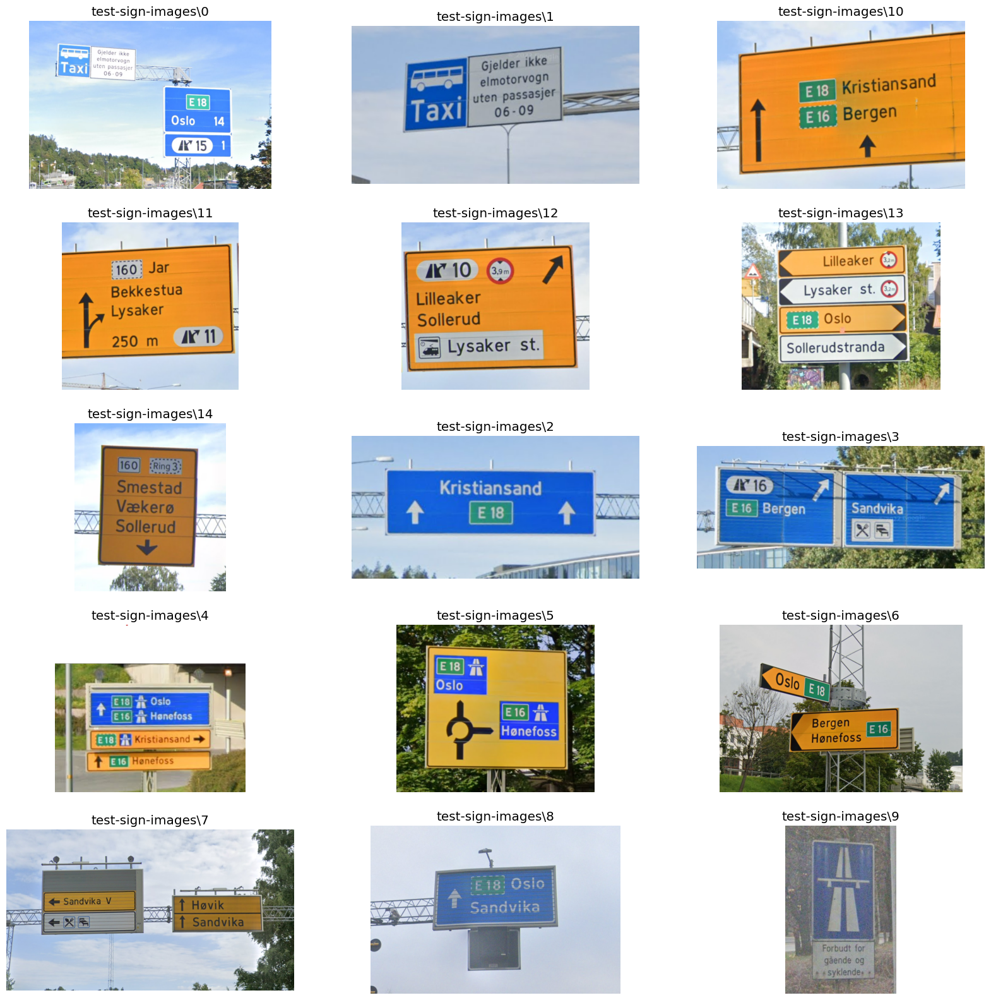

In [5]:
fig, axs = plt.subplots(5, 3, figsize=(20, 20))
axs = axs.flatten()
for i in range(15):
    axs[i].imshow(plt.imread(test_imgs[i]))
    axs[i].axis('off')
    img_id = test_imgs[i].split('/')[-1].split('.')[0]
    axs[i].set_title(f'{img_id}')
plt.show()

## *Extracting Text from Images*

### Method 1 - EASYOCR

In [6]:
# initiate reader
reader = easyocr.Reader(['en', 'no'], gpu = True)

# reading text
img = test_imgs[8]
res = reader.readtext(img)

pd.DataFrame(res, columns=['bbox', 'text', 'conf'])

CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.


,bbox,text,conf
0,"[[210, 182], [422, 182], [422, 280], [210, 280]]",IK 16,0.652453
1,"[[200, 326], [330, 326], [330, 400], [200, 400]]",E16,0.995995
2,"[[373, 316], [655, 316], [655, 436], [373, 436]]",Bergen,0.999990
3,"[[901, 319], [1226, 319], [1226, 412], [901, 4...",Sandvika,0.999930
4,"[[1150, 412], [1208, 412], [1208, 444], [1150,...",74,0.117607
5,"[[1234, 399], [1349, 399], [1349, 447], [1234,...",2555,0.084108


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


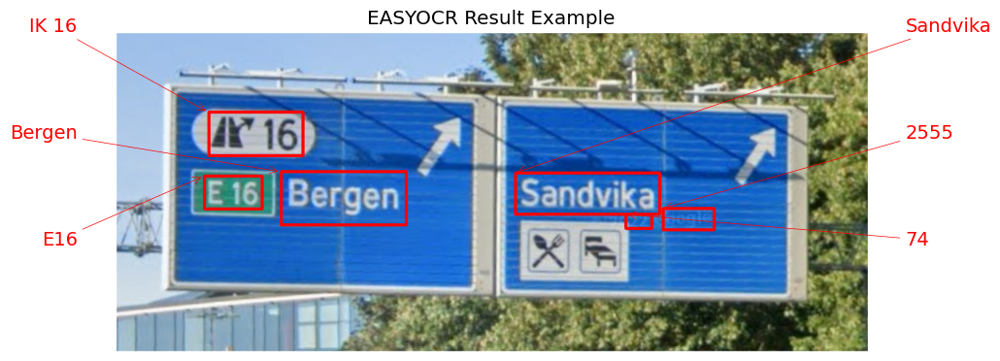

In [7]:
# Plot image and its annotations
fig, ax = plt.subplots(figsize = (10, 10))
res = pd.DataFrame(res, columns=['bbox', 'text', 'conf'])[['text','bbox']].values.tolist()
res = [(x[0], np.array(x[1])) for x in res]
keras_ocr.tools.drawAnnotations(plt.imread(img), res, ax=ax)
ax.set_title('EASYOCR Result Example')
plt.show()


### Method 2 - KERAS-OCR

In [8]:
# initiate reader
pipeline = keras_ocr.pipeline.Pipeline()

# reading text
res = pipeline.recognize([test_imgs[0]])

pd.DataFrame(res[0], columns = ['text', 'bbox'])

Looking for C:\Users\MarwanMM\.keras-ocr\craft_mlt_25k.h5
Looking for C:\Users\MarwanMM\.keras-ocr\crnn_kurapan.h5
1/1 [==============================] - 2s 2s/step


,text,bbox
0,sooo,"[[1202.9786, 50.13649], [1268.321, 53.980152],..."
1,le,"[[1263.5449, 52.89258], [1289.0117, 52.89258],..."
2,gielder,"[[568.5995, 235.50287], [730.8658, 246.32062],..."
3,ikke,"[[741.038, 247.89406], [833.2256, 255.26906], ..."
4,ellmotorvogn,"[[561.987, 291.24466], [839.25574, 320.43082],..."
5,taxi,"[[264.4589, 335.69843], [496.32208, 351.50726]..."
6,uten,"[[531.42053, 350.27396], [632.69794, 355.60437..."
7,passasjer,"[[650.5622, 365.5363], [864.49493, 369.16226],..."
8,06,"[[619.03906, 415.3047], [685.64453, 415.3047],..."
9,09,"[[711.1113, 421.18164], [775.7578, 421.18164],..."


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


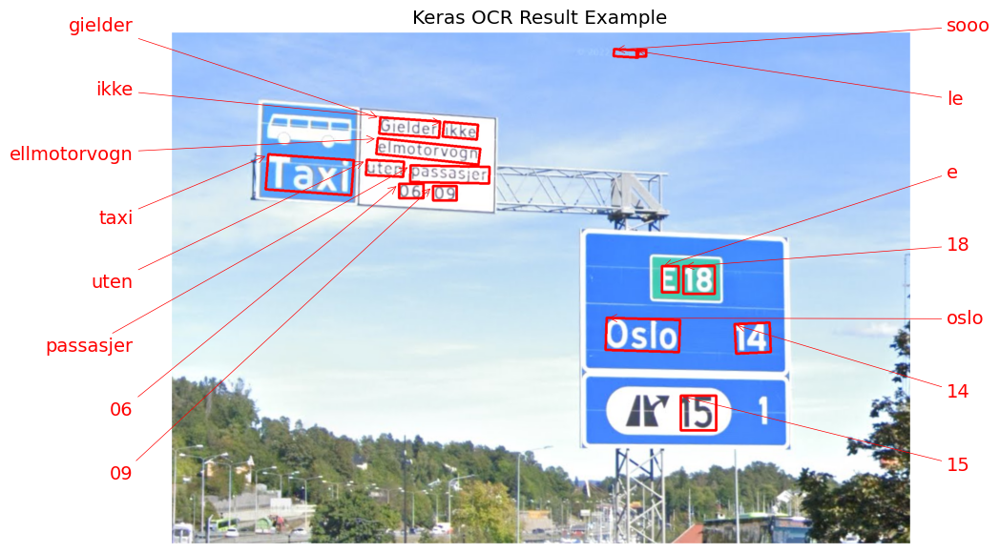

In [9]:
# Plot image and its annotations
fig, ax = plt.subplots(figsize = (10, 10))
keras_ocr.tools.drawAnnotations(plt.imread(test_imgs[0]), res[0], ax=ax)
ax.set_title('Keras OCR Result Example')
plt.show()

## *Model Comparison*

### Plot Results : easyocr vs keras_ocr

In [10]:
def plot_comparison(img, reader_easy, reader_keras):
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))

    # easyocr
    # reading img
    easy_res = reader_easy.readtext(img)
    easy_res = pd.DataFrame(easy_res, columns=['bbox', 'text', 'conf'])[['text','bbox']].values.tolist()
    easy_res = [(x[0], np.array(x[1])) for x in easy_res]
    keras_ocr.tools.drawAnnotations(plt.imread(img), easy_res, ax=axs[0])
    axs[0].set_title('easyocr results', fontsize=24)

    # keras-ocr
    # reading img
    keras_res = reader_keras.recognize([img])
    keras_res = pd.DataFrame(keras_res[0], columns = ['text', 'bbox'])[['text','bbox']].values.tolist()
    keras_ocr.tools.drawAnnotations(plt.imread(img), keras_res, ax=axs[1])
    axs[1].set_title('keras_ocr results', fontsize=24)

    plt.show()

CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.


Looking for C:\Users\MarwanMM\.keras-ocr\craft_mlt_25k.h5
Looking for C:\Users\MarwanMM\.keras-ocr\crnn_kurapan.h5


  0%|          | 0/15 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 1s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


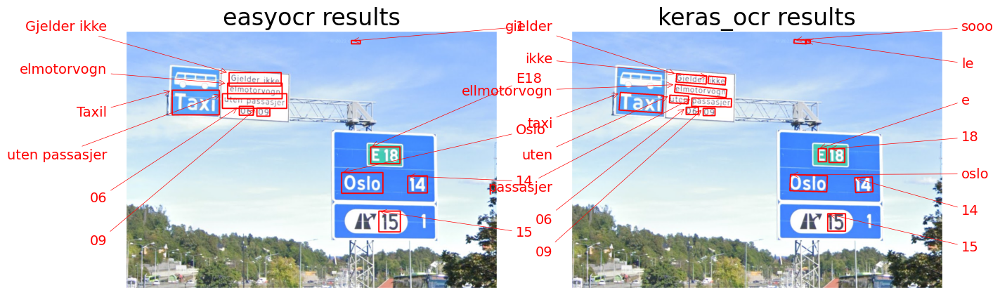

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 360ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


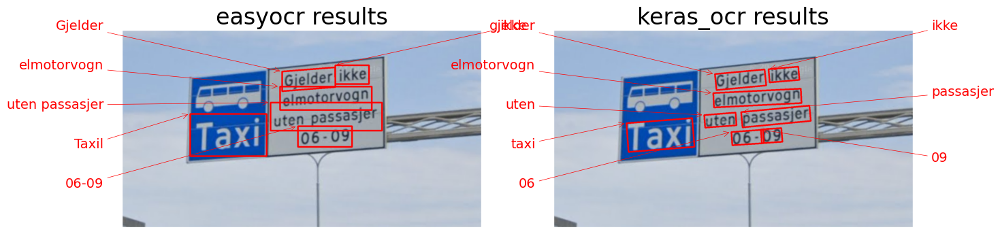

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 358ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


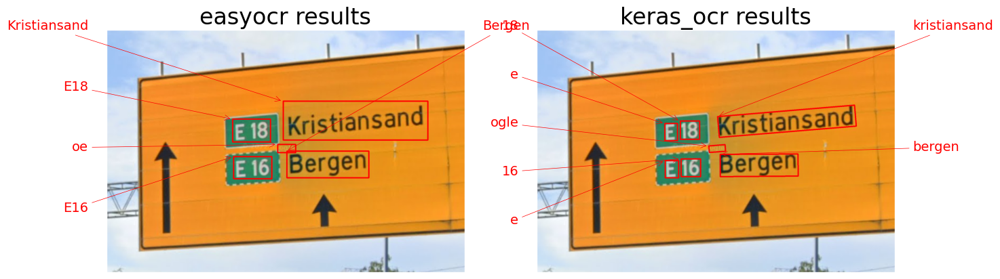

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 382ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


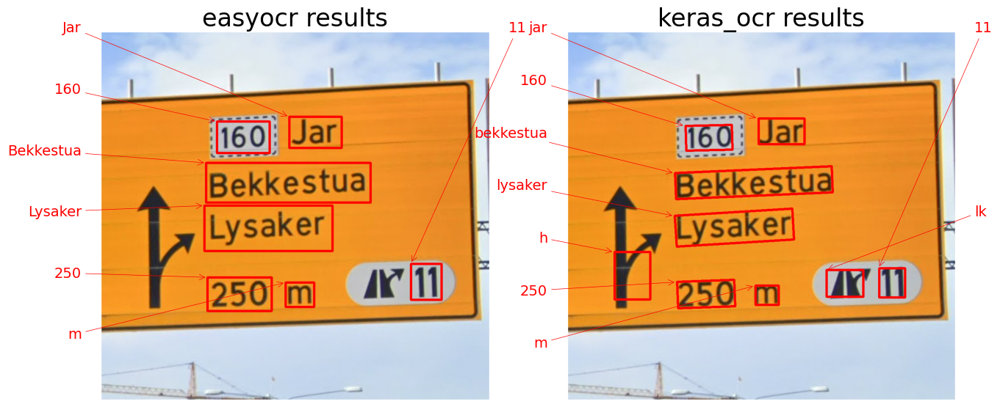

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 41ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


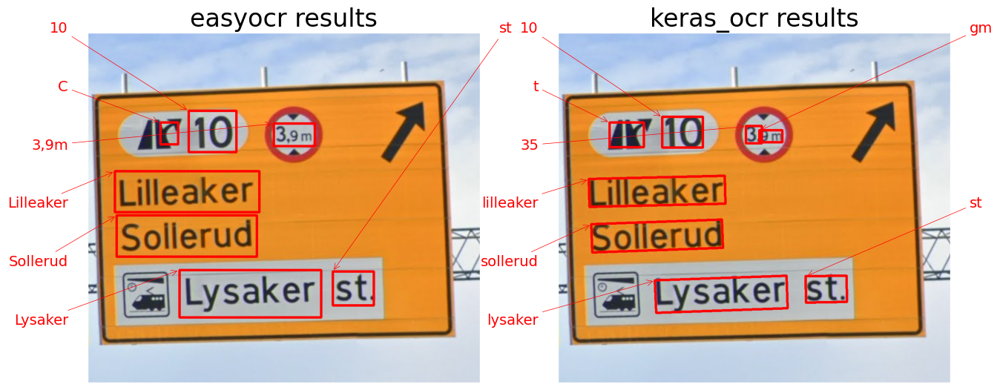

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 416ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


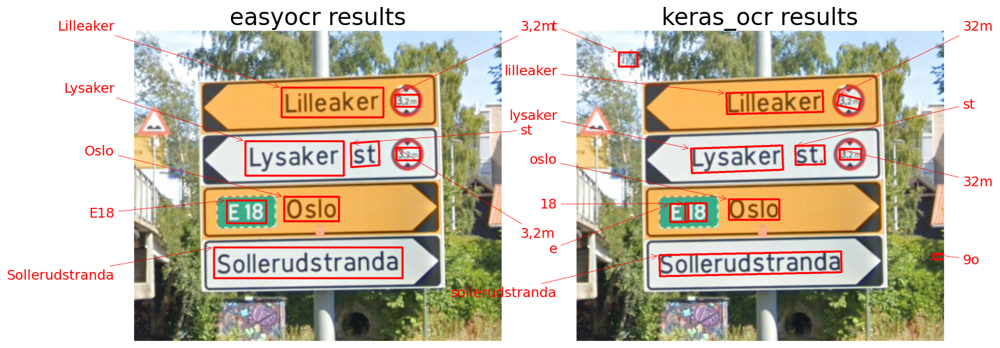

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 334ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


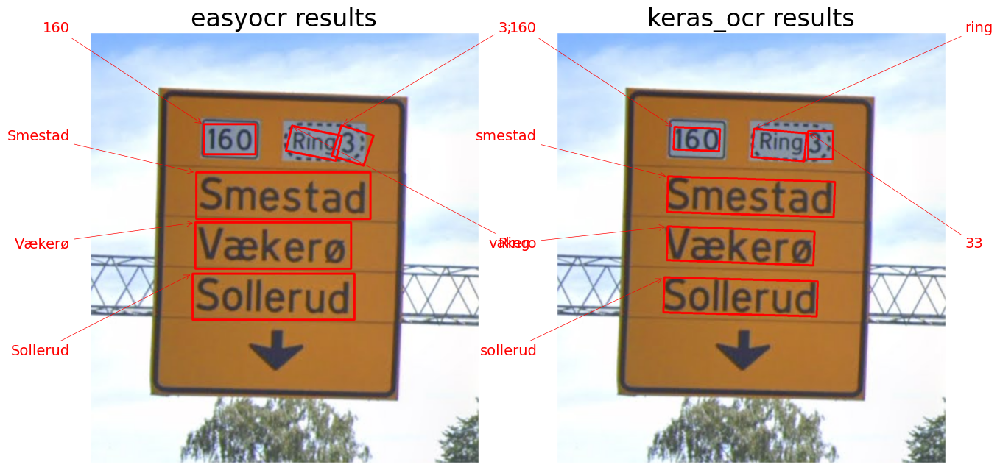

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 279ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


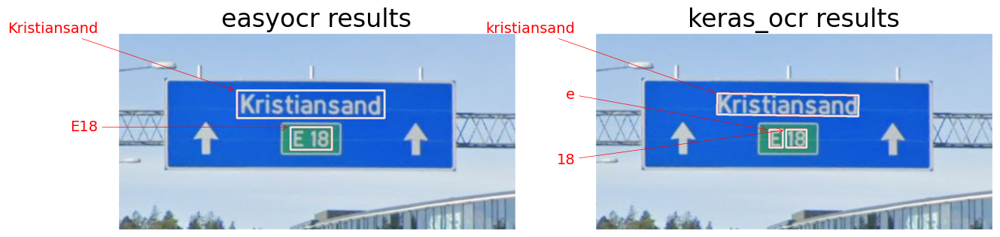

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 47ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


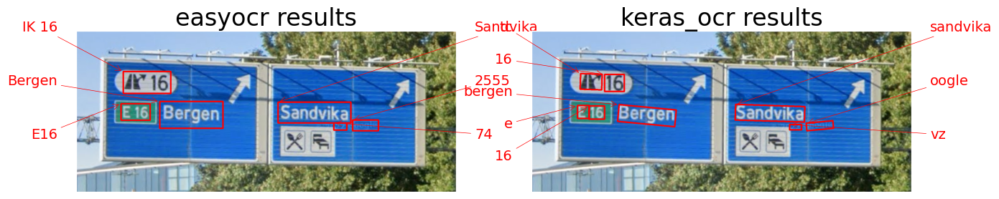

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 47ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


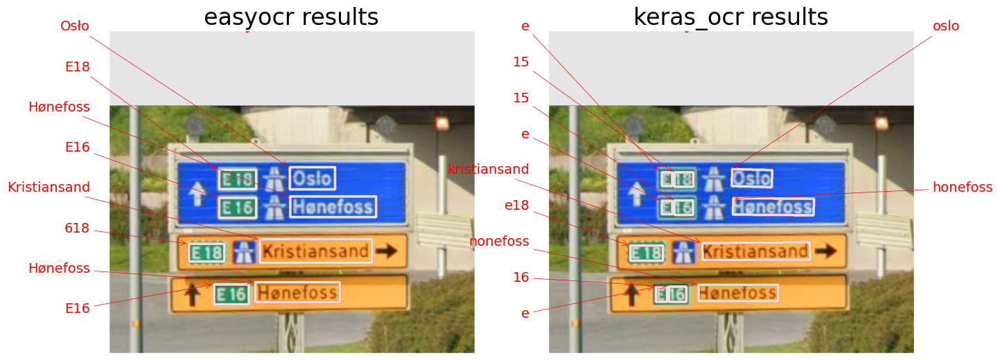

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 40ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


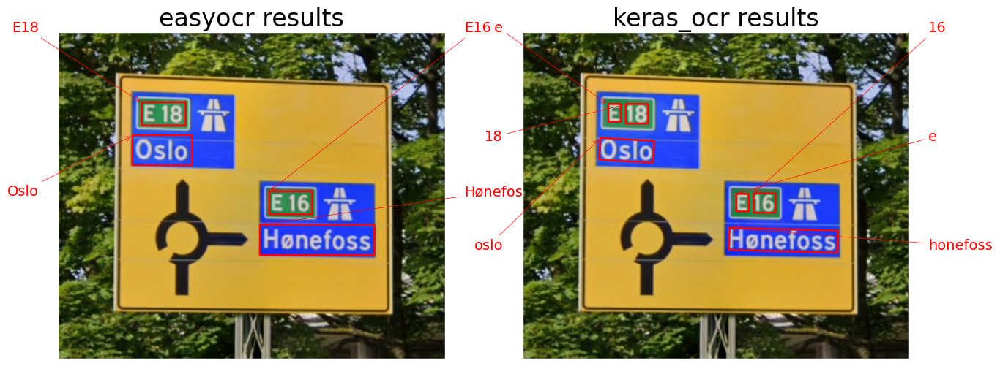

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 38ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


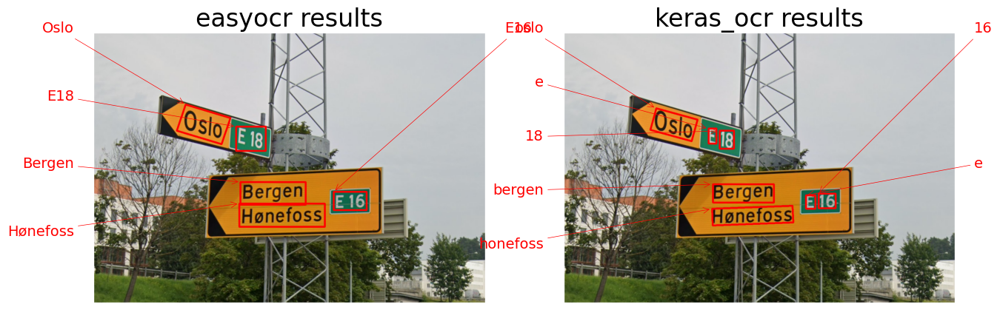

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 41ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


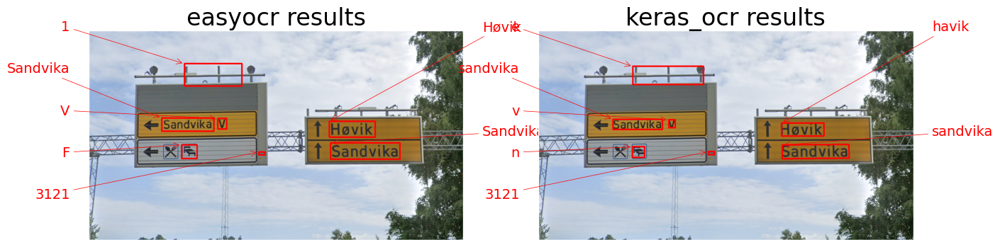

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 335ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


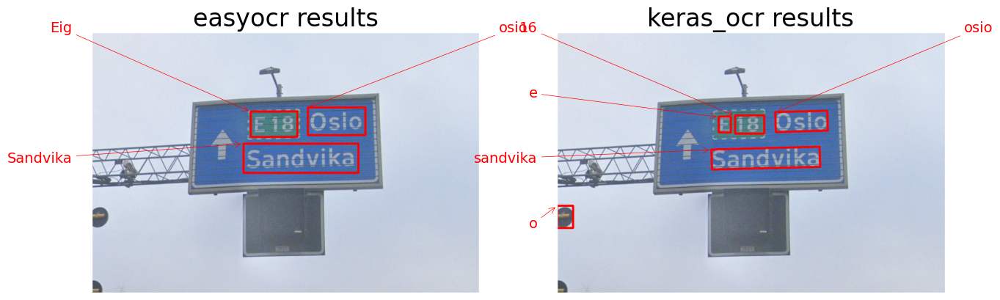

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 39ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


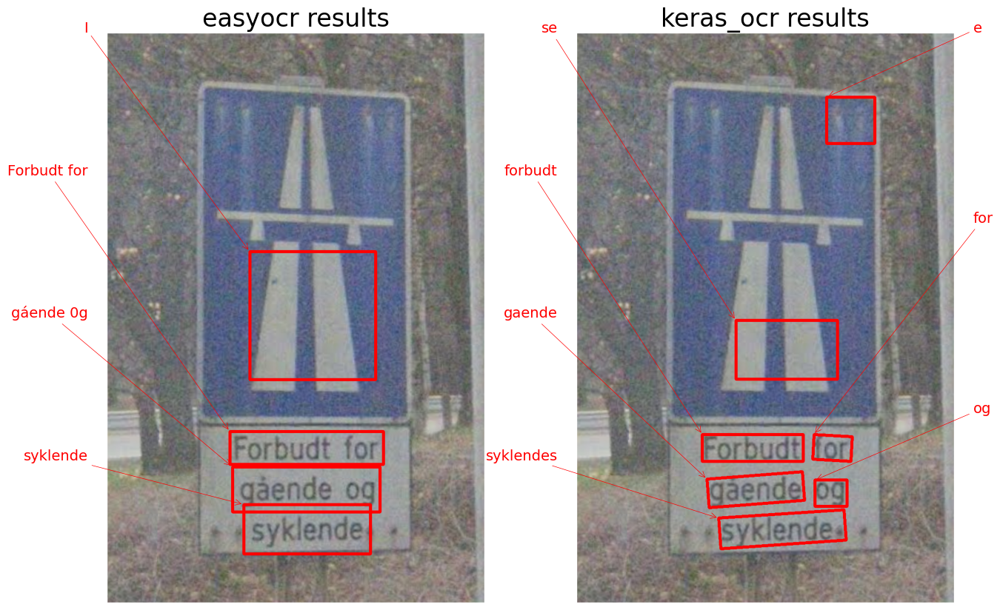

In [11]:
# initiate easyocr reader
reader_easy = easyocr.Reader(['en', 'no'], gpu = True)

# initiate keras-ocr reader
reader_keras = keras_ocr.pipeline.Pipeline()

# loop over test images
for img in tqdm(test_imgs):
    plot_comparison(img, reader_easy, reader_keras)
